In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import os
import scipy as sp
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error


from cell_inference.config import paths, params
from cell_inference.utils.transform.geometry_transformation import hphi2unitsphere, unitsphere2hphi, trivarnorm2unitsphere
from cell_inference.utils.feature_extractors.SummaryStats2D import DY
from cell_inference.utils.data_manager import NpzFilesCollector

%matplotlib inline

TRIAL_NAME = 'Reduced_Order_stochastic_spkwid_trunkLR4_LactvCa_Loc3_h1_sumstats7'

## Load simulation data

In [2]:
DATA_PATH = paths.SIMULATED_DATA_PATH
TRIAL_PATH = os.path.join(DATA_PATH, TRIAL_NAME)

CONFIG_PATH = os.path.join(TRIAL_PATH, 'config.json')  # trial configuration
STATS_PATH = os.path.join(TRIAL_PATH, 'summ_stats.npz')  # summary statistics

try:
    STATS = np.load(STATS_PATH)
except:
    STATS = NpzFilesCollector(STATS_PATH)
with STATS:
    full_summ_stats = STATS['x']
    labels = STATS['y']
    ys = STATS['ys']

with open(CONFIG_PATH, 'r') as f:
    config_dict = json.load(f)

inference_list = config_dict['Trial_Parameters']['inference_list']
ranges = {k: v.copy() for p in ['loc', 'geo', 'bio'] \
    for k, v in config_dict['Simulation_Parameters'].get(p + '_param_range', {}).items()}

print(inference_list)

['y', 'd', 'theta', 'l_t', 'lr_pt', 'r_t', 'rr_dt']


In [3]:
# # Select summary statistics
# filter_id = [slice(8, 24), slice(56, 68), slice(72, 84)] # tr/pk time stats, decay and propagation fit
# tr_pk_time_ids = np.array([11, 12, 14, 15, 19, 20, 22, 23]) # tr/pk time stats
# filter_id[0] = tr_pk_time_ids
# feat_ids = np.arange(summ_stats.shape[1])
# feat_ids = np.concatenate([feat_ids[idx] for idx in filter_id])
# np.savetxt(os.path.join(TRIAL_PATH, 'TrPkStats_id.txt'), feat_ids, fmt='%d')

In [4]:
# load summary statistics
feat_ids = np.loadtxt(os.path.join(TRIAL_PATH, 'TrPkStats_id.txt'), dtype=int)

In [5]:
summ_stats = full_summ_stats[:, feat_ids]
summ_stats_names = params.SUMM_STATS_NAMES[feat_ids]
df_summ_stats = pd.DataFrame(dict(zip(summ_stats_names, summ_stats.T)))

### Transform labels

In [6]:
label_list = inference_list.copy()

In [7]:
has_yshift = 'y' in label_list and ys.size != 0
if has_yshift:
    ys_idx = label_list.index('y')
    labels[:,ys_idx] = ys
    label_list[ys_idx] = 'ys'

df_la = pd.DataFrame(labels, columns=label_list)

with pd.option_context('display.max_rows', 10):
    display(df_la)

,ys,d,theta,l_t,lr_pt,r_t,rr_dt
0,-14.414987,145.544253,-0.874783,1133.789502,0.145403,1.025618,0.707673
1,-24.528710,90.468007,-0.299473,1133.789502,0.145403,1.025618,0.707673
2,-1.375555,56.146029,-0.066361,1133.789502,0.145403,1.025618,0.707673
3,-1.890745,52.479145,0.529333,1133.789502,0.145403,1.025618,0.707673
4,-60.301096,171.990536,0.056110,1133.789502,0.145403,1.025618,0.707673
...,...,...,...,...,...,...,...
5947,6.340327,82.196481,-0.496874,223.262371,0.273607,0.607872,0.413009
5948,24.130434,139.240374,0.173254,223.262371,0.273607,0.607872,0.413009
5949,24.616782,146.455017,0.476419,223.262371,0.273607,0.607872,0.413009
5950,14.014887,68.084727,-0.035685,223.262371,0.273607,0.607872,0.413009


## Evaluate correlations

In [8]:
def corr_in_plot(x, y, xy=(.7, .9), ax=None, hue=None, **kwargs):
    """Plot the correlation coefficient at xy location of axis, by default top right"""
    corr = sp.stats.pearsonr(x, y)
    corr = corr.statistic if hasattr(corr, 'statistic') else corr[0]
    ax = ax or plt.gca()
    ax.annotate(f'p={corr:.3f}', xy=xy, xycoords=ax.transAxes)
    return corr

def aling_axes_limits(axes, axis='xy', include_diag=False):
    """Ensure limits of axes on each pairplot match"""
    lims = np.empty((2, axes.size, 2)) # (xy, axes, limits)
    for i, ax in enumerate(axes.ravel()):
        lims[0, i] = ax.get_xlim()
        lims[1, i] = ax.get_ylim()
    lims = lims.reshape((2, ) + axes.shape + (2, ))
    if not include_diag:
        for i in range(min(axes.shape)):
            lims[:, i, i, 0] = -np.inf
            lims[:, i, i, 1] = np.inf
    align_x, align_y = 'x' in axis, 'y' in axis
    xlims = np.column_stack((lims[0, :, :, 0].max(axis=0), lims[0, :, :, 1].min(axis=0))) if align_x else None
    ylims = np.column_stack((lims[1, :, :, 0].max(axis=1), lims[1, :, :, 1].min(axis=1))) if align_y else None
    for i in range(axes.shape[0]):
        for j in range(axes.shape[1]):
            ax = axes[i, j]
            if align_x:
                ax.set_xlim(xlims[j])
            if align_y and (include_diag or i != j):
                ax.set_ylim(ylims[i])

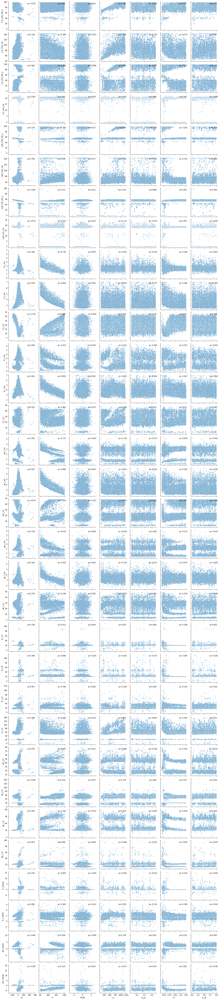

In [9]:
imgage_file = os.path.join(TRIAL_PATH, 'parameter_feature_correlation.png')
if os.path.isfile(imgage_file):
    import matplotlib.image as mpimg
    plt.figure(figsize=(16, 80))
    imgplot = plt.imshow(mpimg.imread(imgage_file), aspect='equal')
    plt.gca().axis('off')
    plt.tight_layout()
else:
    g = sns.pairplot(pd.concat((df_la, df_summ_stats), axis=1),
                     x_vars=label_list, y_vars=summ_stats_names,
                     plot_kws=dict(marker='.'))
    g.map(corr_in_plot)
    plt.savefig(imgage_file)
plt.show()

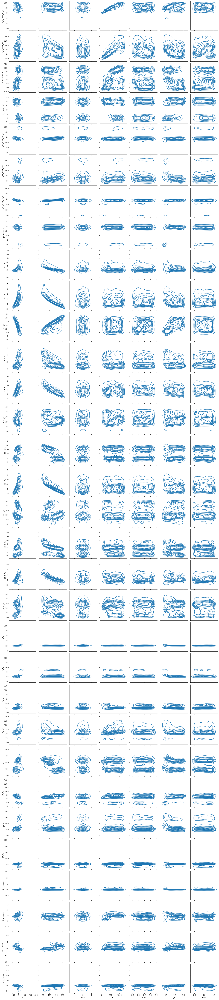

In [10]:
imgage_file = os.path.join(TRIAL_PATH, 'parameter_feature_kde.png')
if os.path.isfile(imgage_file):
    import matplotlib.image as mpimg
    plt.figure(figsize=(16, 80))
    imgplot = plt.imshow(mpimg.imread(imgage_file), aspect='equal')
    plt.gca().axis('off')
    plt.tight_layout()
else:
    g = sns.pairplot(pd.concat((df_la, df_summ_stats), axis=1),
                     x_vars=label_list, y_vars=summ_stats_names,
                     kind='kde')
    plt.savefig(imgage_file)
plt.show()

## Correlations with feature importance

In [11]:
MODEL_PATH = os.path.join(TRIAL_PATH, 'RandomForestAnalysis')
in_name = 'stats_tr_pk'
out_name = 'morph'

feat_all_df = pd.read_csv(os.path.join(MODEL_PATH, in_name + '-allmorph_importance.csv'), index_col=0)
feat_indiv_df = pd.read_csv(os.path.join(MODEL_PATH, in_name + '-individual_importance.csv'), header=[0, 1], index_col=0)
with open(os.path.join(MODEL_PATH, out_name + '_out.txt'), 'r') as f:
        label_list = f.read().splitlines()

with pd.option_context('display.max_rows', None, 'display.float_format', '{:.3g}'.format):
    display(feat_all_df)
    display(feat_indiv_df)

,id,importance,feature
0,11,0.196,t_tr_max_idx_y
1,73,0.113,tr_l_t2
2,72,0.104,tr_l_t1
3,12,0.0545,t_tr_max_val
4,77,0.0486,pk_l_t2
5,75,0.0376,tr_r_t2
6,20,0.0361,t_pk_max_val
7,14,0.035,t_tr_min_idx_y
8,74,0.0312,tr_r_t1
9,59,0.031,tr_r_w1


l_t                            lr_pt                            r_t  \
    id importance         feature    id importance         feature  id   
0   11      0.675  t_tr_max_idx_y    12     0.0821    t_tr_max_val  72   
1   75     0.0517         tr_r_t2    20     0.0786    t_pk_max_val  73   
2   14     0.0456  t_tr_min_idx_y    74     0.0733         tr_r_t1  59   
3   15     0.0454    t_tr_min_val    75     0.0615         tr_r_t2  80   
4   74     0.0334         tr_r_t1    77     0.0547         pk_l_t2  20   
5   23     0.0239    t_pk_min_val    78     0.0538         pk_r_t1  74   
6   12     0.0161    t_tr_max_val    81     0.0496      tr_r_tprop  77   
7   60     0.0146         tr_r_w2    73      0.044         tr_l_t2  82   
8   72     0.0106         tr_l_t1    79     0.0327         pk_r_t2  11   
9   81    0.00736      tr_r_tprop    59     0.0299         tr_r_w1  81   
10  19    0.00706  t_pk_max_idx_y    67     0.0292         pk_r_y1  14   
11  61    0.00541         tr_r_y1    62     0.0275         pk_l_w1  67   
12  73     0.0052         tr_l_t2    76     0.0269         pk_l_t1  12   
13  66    0.00515         pk_r_w2    61     0.0254         tr_r_y1  65   
14  67    0.00509         pk_r_y1    80     0.0249      tr_l_tprop  56   
15  58    0.00416         tr_l_y1    11     0.0241  t_tr_max_idx_y  62   
16  62    0.00405         pk_l_w1    58     0.0235         tr_l_y1  58   
17  20    0.00394    t_pk_max_val    60     0.0233         tr_r_w2  76   
18  77    0.00394         pk_l_t2    14     0.0225  t_tr_min_idx_y  61   
19  59    0.00392         tr_r_w1    83     0.0223      pk_r_tprop  75   
20  56    0.00354         tr_l_w1    72     0.0222         tr_l_t1  60   
21  78    0.00283         pk_r_t1    65      0.022         pk_r_w1  79   
22  76    0.00282         pk_l_t1    64     0.0206         pk_l_y1  64   
23  63    0.00261         pk_l_w2    82     0.0204      pk_l_tprop  78   
24  80    0.00248      tr_l_tprop    66     0.0198         pk_r_w2  66   
25  83     0.0024      pk_r_tprop    56     0.0189         tr_l_w1  83   
26  64    0.00222         pk_l_y1    23     0.0165    t_pk_min_val  15   
27  79     0.0022         pk_r_t2    19     0.0136  t_pk_max_idx_y  23   
28  82    0.00219      pk_l_tprop    63     0.0134         pk_l_w2  63   
29  65    0.00219         pk_r_w1    57      0.012         tr_l_w2  57   
30  57    0.00211         tr_l_w2    22    0.00705  t_pk_min_idx_y  22   
31  22    0.00117  t_pk_min_idx_y    15    0.00407    t_tr_min_val  19   

                              rr_dt                             
   importance         feature    id importance         feature  
0       0.527         tr_l_t1    77     0.0931         pk_l_t2  
1       0.128         tr_l_t2    73     0.0817         tr_l_t2  
2      0.0937         tr_r_w1    12     0.0652    t_tr_max_val  
3      0.0632      tr_l_tprop    14     0.0632  t_tr_min_idx_y  
4      0.0309    t_pk_max_val    78     0.0432         pk_r_t1  
5      0.0143         tr_r_t1    75      0.043         tr_r_t2  
6      0.0118         pk_l_t2    60     0.0429         tr_r_w2  
7     0.00981      pk_l_tprop    74     0.0428         tr_r_t1  
8     0.00934  t_tr_max_idx_y    67      0.039         pk_r_y1  
9     0.00917      tr_r_tprop    81     0.0361      tr_r_tprop  
10    0.00813  t_tr_min_idx_y    59     0.0354         tr_r_w1  
11     0.0081         pk_r_y1    79     0.0353         pk_r_t2  
12     0.0077    t_tr_max_val    76     0.0302         pk_l_t1  
13    0.00754         pk_r_w1    11     0.0295  t_tr_max_idx_y  
14    0.00742         tr_l_w1    62     0.0271         pk_l_w1  
15    0.00692         pk_l_w1    66     0.0259         pk_r_w2  
16    0.00646         tr_l_y1    20     0.0252    t_pk_max_val  
17    0.00611         pk_l_t1    61     0.0251         tr_r_y1  
18    0.00599         tr_r_y1    83     0.0249      pk_r_tprop  
19    0.00506         tr_r_t2    58     0.0239         tr_l_y1  
20    0.00483         tr_r_w2    65     0.0238         p

#### All morphological parameters together

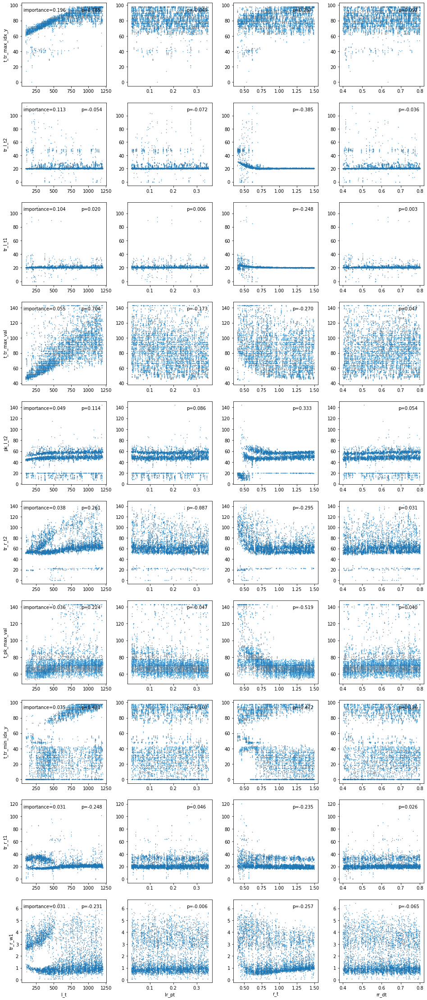

In [12]:
n_top = 10

_, axs = plt.subplots(n_top, len(label_list), figsize=(4 * len(label_list), 4 * n_top), squeeze=False)
for i in range(n_top):
    feature = feat_all_df.loc[i, 'feature']
    y = df_summ_stats[feature]
    for j, L in enumerate(label_list):
        x = df_la[L]
        ax = axs[i, j]
        ax.plot(x, y, '.', markersize=1)
        _ = corr_in_plot(x, y, xy=(.7, .9), ax=ax)
    importance = feat_all_df.loc[i, 'importance']
    ax = axs[i, 0]
    ax.annotate(f'importance={importance:.3f}', xy=(.02, .9), xycoords=ax.transAxes)
    ax.set_ylabel(feature)
for ax, L in zip(axs[-1], label_list):
    ax.set_xlabel(L)
aling_axes_limits(axs, include_diag=True)
plt.subplots_adjust(wspace=0.25)
plt.show()

#### Individual morphological parameters

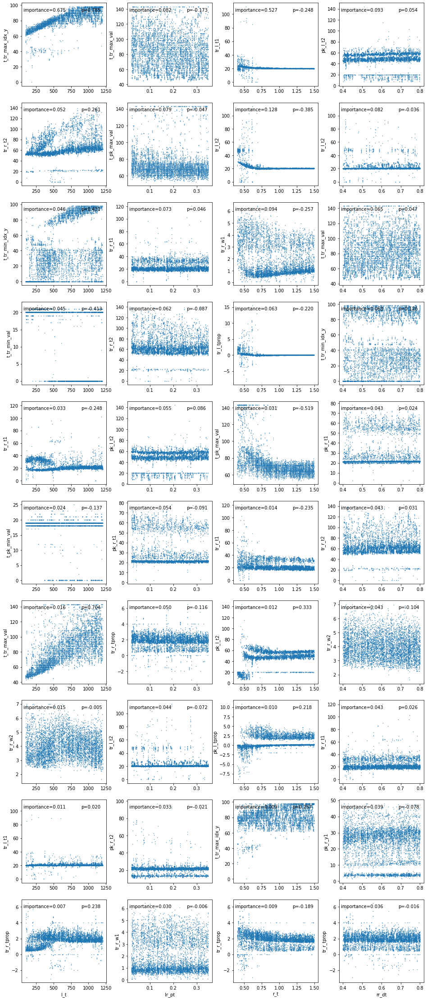

In [13]:
_, axs = plt.subplots(n_top, len(label_list), figsize=(4 * len(label_list), 4 * n_top), squeeze=False)
for i in range(n_top):
    for j, L in enumerate(label_list):
        feature = feat_indiv_df.loc[i, (L, 'feature')]
        y = df_summ_stats[feature]
        x = df_la[L]
        ax = axs[i, j]
        ax.plot(x, y, '.', markersize=1)
        _ = corr_in_plot(x, y, xy=(.7, .9), ax=ax)
        importance = feat_indiv_df.loc[i, (L, 'importance')]
        ax.annotate(f'importance={importance:.3f}', xy=(.02, .9), xycoords=ax.transAxes)
        ax.set_ylabel(feature)
for ax, L in zip(axs[-1], label_list):
    ax.set_xlabel(L)
aling_axes_limits(axs, axis='x', include_diag=True)
plt.subplots_adjust(wspace=0.25)
plt.show()